In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Epoch: 1/10


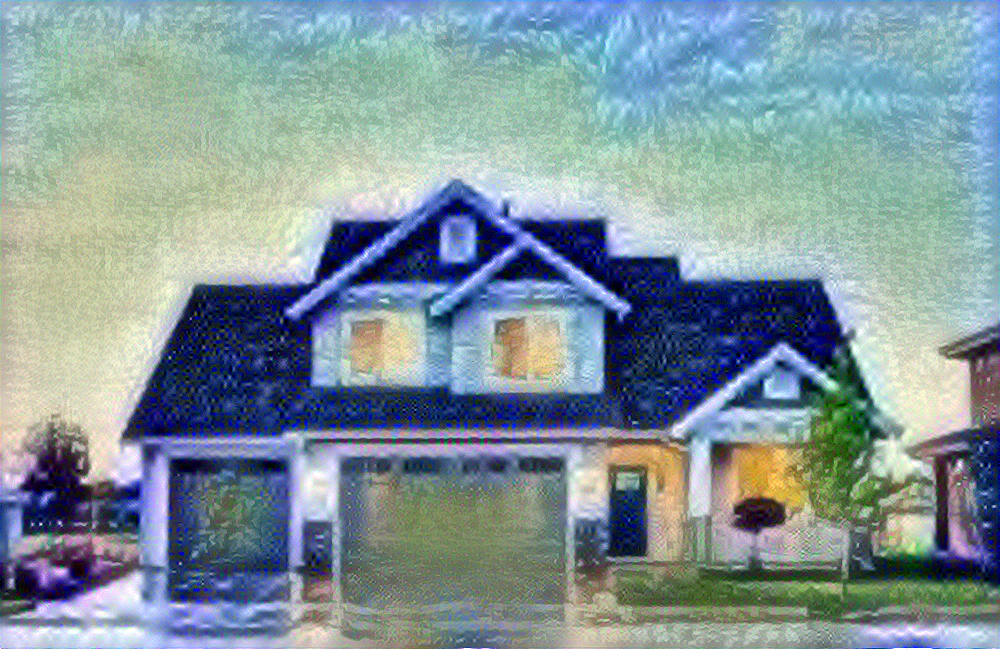

Epoch: 2/10


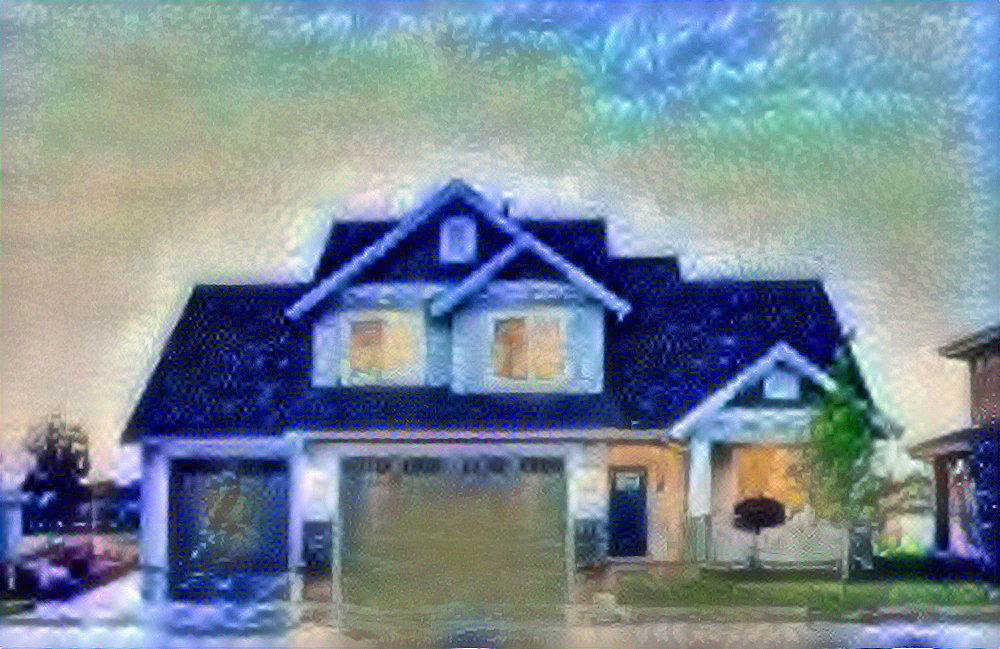

Epoch: 3/10


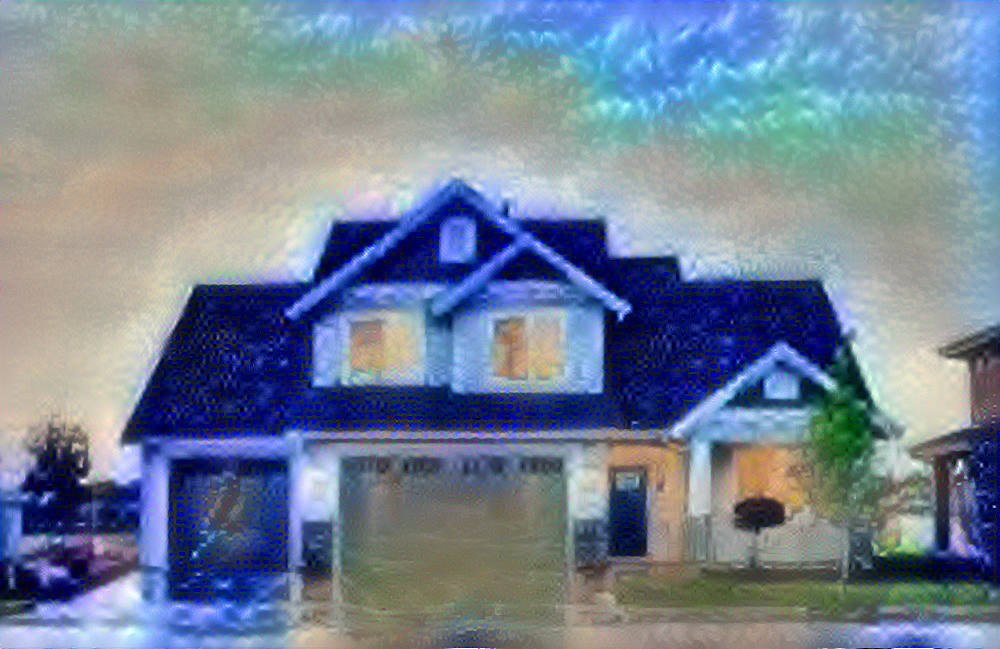

Epoch: 4/10


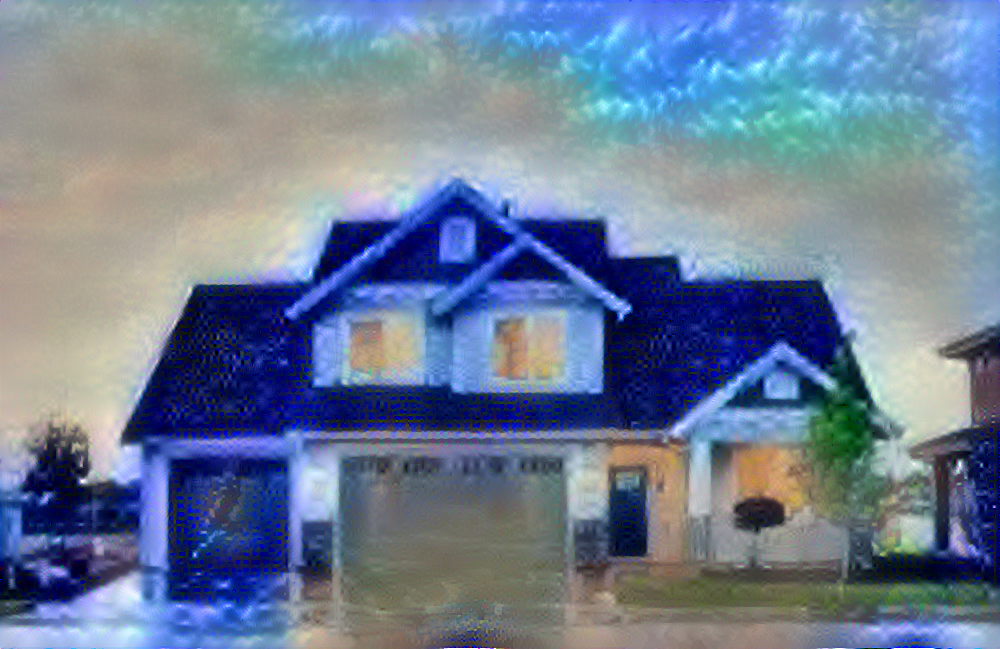

Epoch: 5/10


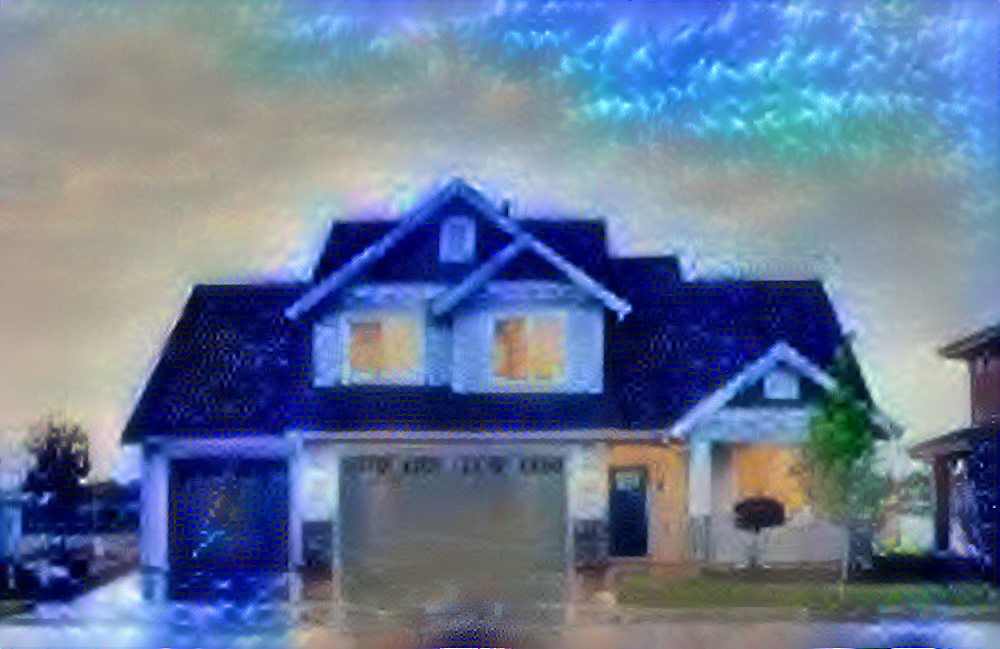

Epoch: 6/10


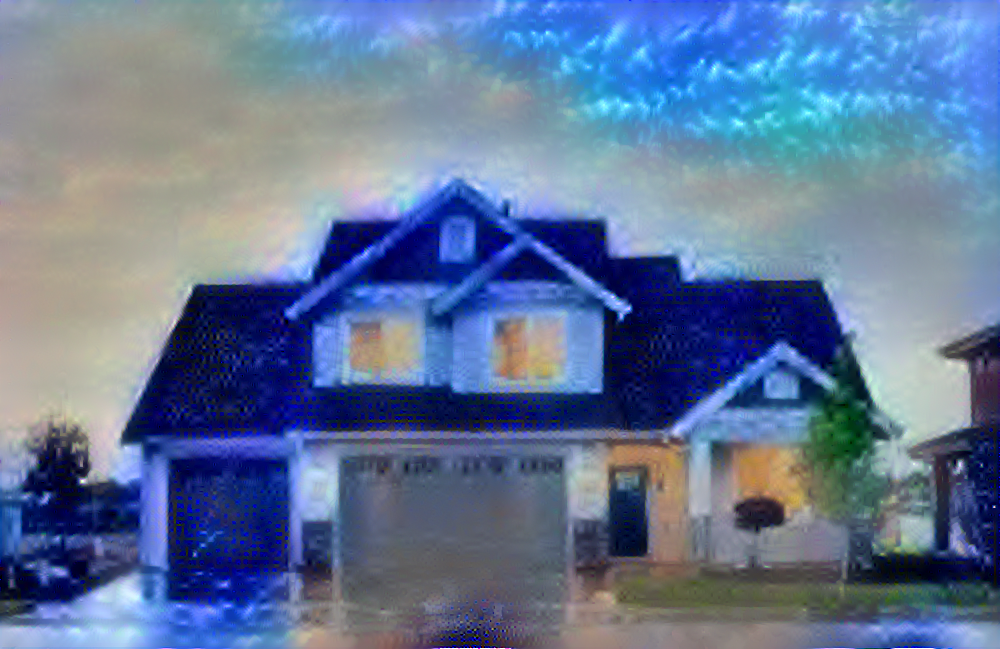

Epoch: 7/10


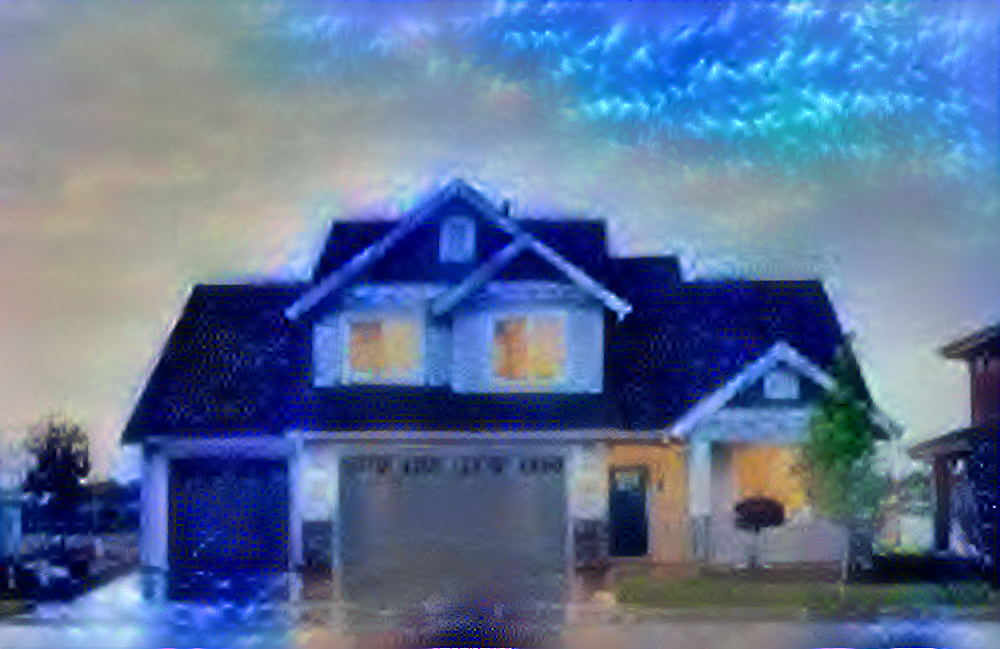

Epoch: 8/10


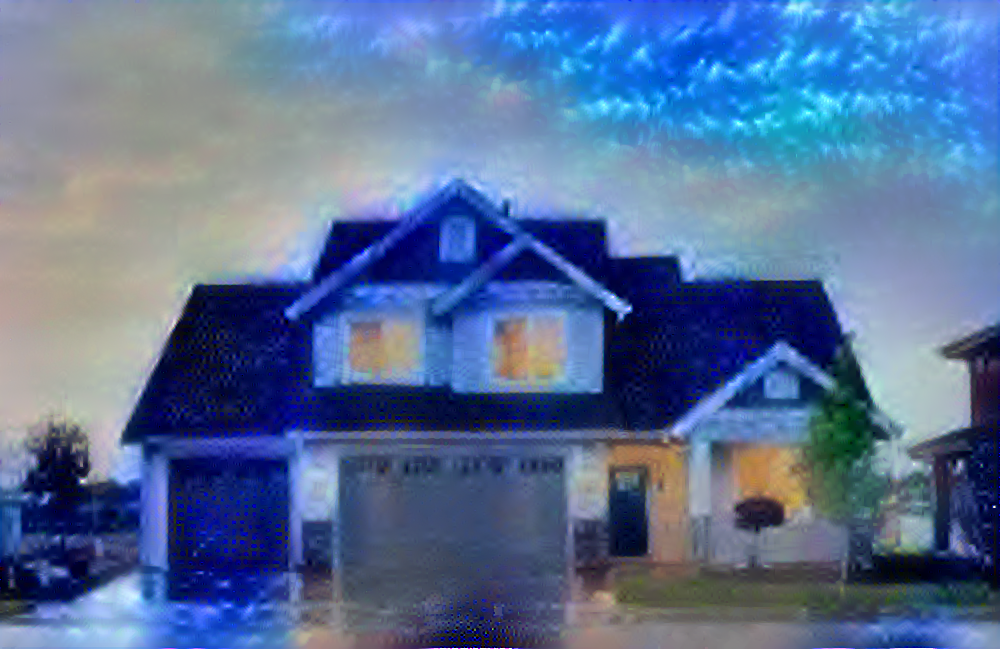

Epoch: 9/10


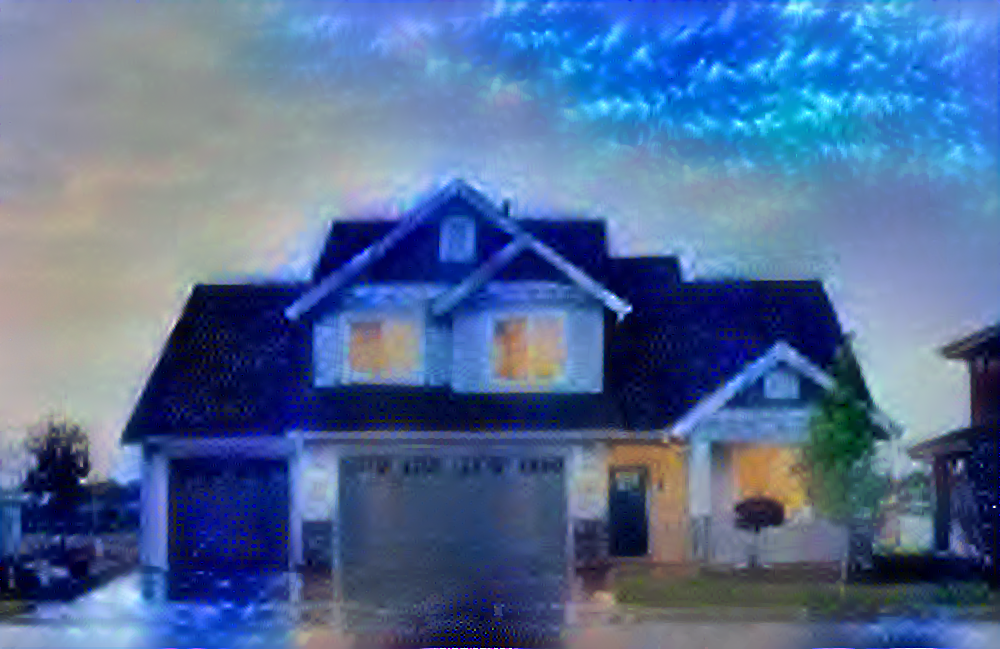

Epoch: 10/10


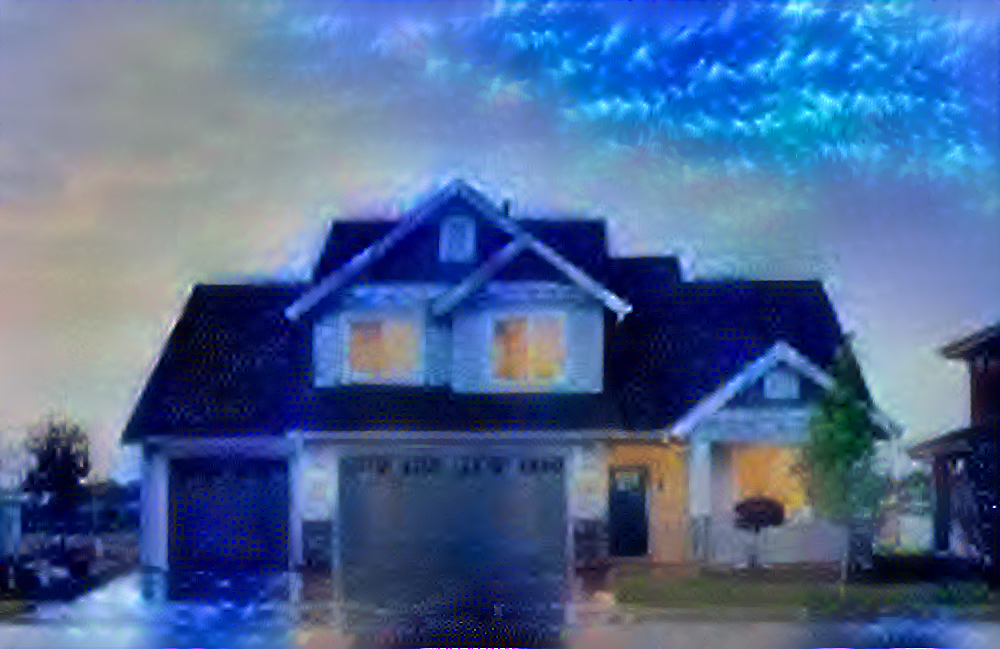

In [6]:
import tensorflow as tf
import numpy as np
import PIL.Image
import IPython.display as display
import os

# Define functions
def tensor_to_image(tensor):
    
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img, max_dim):
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image
    364_dtype(img, tf.float32)
    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim
    new_shape = tf.cast(shape * scale, tf.int32)
    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

def vgg_layers(layer_names):
    vgg = tf.keras.applications.VGG19(include_top=False, weights="imagenet")
    vgg.trainable = False
    outputs = [vgg.get_layer(name).output for name in layer_names]
    model = tf.keras.Model([vgg.input], outputs)
    return model

def gram_matrix(input_tensor):
    result = tf.linalg.einsum("bijc,bijd->bcd", input_tensor, input_tensor)
    num_locations = tf.cast(tf.shape(input_tensor)[1] * tf.shape(input_tensor)[2], tf.float32)
    return result / num_locations

class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super().__init__()
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        inputs = inputs * 255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = outputs[:self.num_style_layers], outputs[self.num_style_layers:]
        style_outputs = [gram_matrix(style_output) for style_output in style_outputs]
        return {"content": dict(zip(self.content_layers, content_outputs)), "style": dict(zip(self.style_layers, style_outputs))}

def style_transfer_image(content, style, epochs=10, steps_per_epoch=100, style_weight=1e-2, content_weight=1e4, total_variation_weight=30, max_dim=1000, save_name="output"):
    content_img = load_img(content, max_dim)
    style_img = load_img(style, max_dim)
    
    content_layers = ["block5_conv2"]
    style_layers = ["block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]
    
    extractor = StyleContentModel(style_layers, content_layers)
    style_targets = extractor(style_img)["style"]
    content_targets = extractor(content_img)["content"]
    
    image = tf.Variable(content_img)
    
    def clip_0_1(image):
        return tf.clip_by_value(image, 0.0, 1.0)
    
    opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
    
    def style_content_loss(outputs):
        style_loss = sum(tf.reduce_mean((outputs["style"][name] - style_targets[name]) ** 2) for name in outputs["style"]) * (style_weight / len(style_layers))
        content_loss = sum(tf.reduce_mean((outputs["content"][name] - content_targets[name]) ** 2) for name in outputs["content"]) * (content_weight / len(content_layers))
        return style_loss + content_loss
    
    @tf.function()
    def train_step(image):
        with tf.GradientTape() as tape:
            outputs = extractor(image)
            loss = style_content_loss(outputs) + total_variation_weight * tf.image.total_variation(image)
        grad = tape.gradient(loss, image)
        opt.apply_gradients([(grad, image)])
        image.assign(clip_0_1(image))
    
    for n in range(epochs):
        print(f"Epoch: {n+1}/{epochs}")
        for _ in range(steps_per_epoch):
            train_step(image)
        img = tensor_to_image(image)
        display.display(img)
        img.save(f"/content/{save_name}-{n}.png")

if __name__ == "__main__":
    # Mount Google Drive if in Colab
    
    
    # Set image paths
    content_path = "/kaggle/input/2imgdata/homepic.jpg"
    style_path = "/kaggle/input/animedata/darkanim.jpg"
    
    style_transfer_image(content_path, style_path, save_name="styled_image")